In [1]:
#importing all necessary libraries
import numpy as np
import pandas as pd
import seaborn as sns
from matplotlib import pyplot
import matplotlib.pyplot as plt
import matplotlib.pylab as pylab
import matplotlib
%matplotlib inline
color = sns.color_palette()
from IPython.display import display
pd.options.display.max_columns = None
# Standard plotly imports
import plotly
import plotly.plotly as py
import plotly.figure_factory as ff
import plotly.graph_objs as go
from plotly.offline import iplot, init_notebook_mode
# Using plotly + cufflinks in offline mode
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import cufflinks as cf
cf.set_config_file(offline=True)
import cufflinks
cufflinks.go_offline(connected=True)
init_notebook_mode(connected=True)
#ML Libraries from sklearn
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import GradientBoostingClassifier

In [2]:
#loading the data set and checking whether it has got loaded correctly
dataFrame=pd.read_csv('D:\GLALMIWorkSpace\Module1\Week4\diabetes.csv')
dataFrame.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1


In [3]:
dataFrame.describe(include="all") #checking for stats

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
count,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000
mean,3.845052,120.894531,69.105469,20.536458,79.799479,31.992578,0.471876,33.240885,0.348958
std,3.369578,31.972618,19.355807,15.952218,115.244002,7.884160,0.331329,11.760232,0.476951
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.078000,21.000000,0.000000
25%,1.000000,99.000000,62.000000,0.000000,0.000000,27.300000,0.243750,24.000000,0.000000
50%,3.000000,117.000000,72.000000,23.000000,30.500000,32.000000,0.372500,29.000000,0.000000
75%,6.000000,140.250000,80.000000,32.000000,127.250000,36.600000,0.626250,41.000000,1.000000
max,17.000000,199.000000,122.000000,99.000000,846.000000,67.100000,2.420000,81.000000,1.000000


There are missing values in the dataset. This is evident from the fact that minimum values are indicated as zero in Insulin/BMI/Glucose/BP/SkinThickness.We also get to know that the data set has got the patients that fall in age between 21 and 81. 

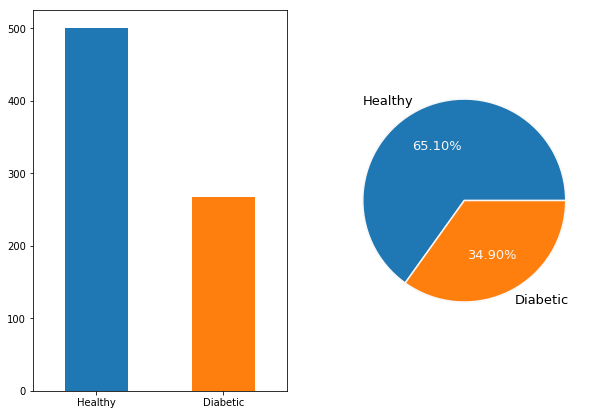

In [4]:
#checking out the percentage of people having diabetes in the data set 
f, ax = plt.subplots(1, 2, figsize = (10, 7))
_ = dataFrame.Outcome.value_counts().plot.bar(ax = ax[0], rot = 0).set(xticklabels = ["Healthy", "Diabetic"])
_ = dataFrame.Outcome.value_counts().plot.pie(labels = ("Healthy", "Diabetic"), autopct = "%.2f%%", label = "", fontsize = 13., ax = ax[1],wedgeprops = {"linewidth": 1.5, "edgecolor": "#F7F7F7"}), ax[1].texts[1].set_color("#F7F7F7"), ax[1].texts[3].set_color("#F7F7F7")

    By looking here,we get to know the density of outliers present in the data and the skewness too

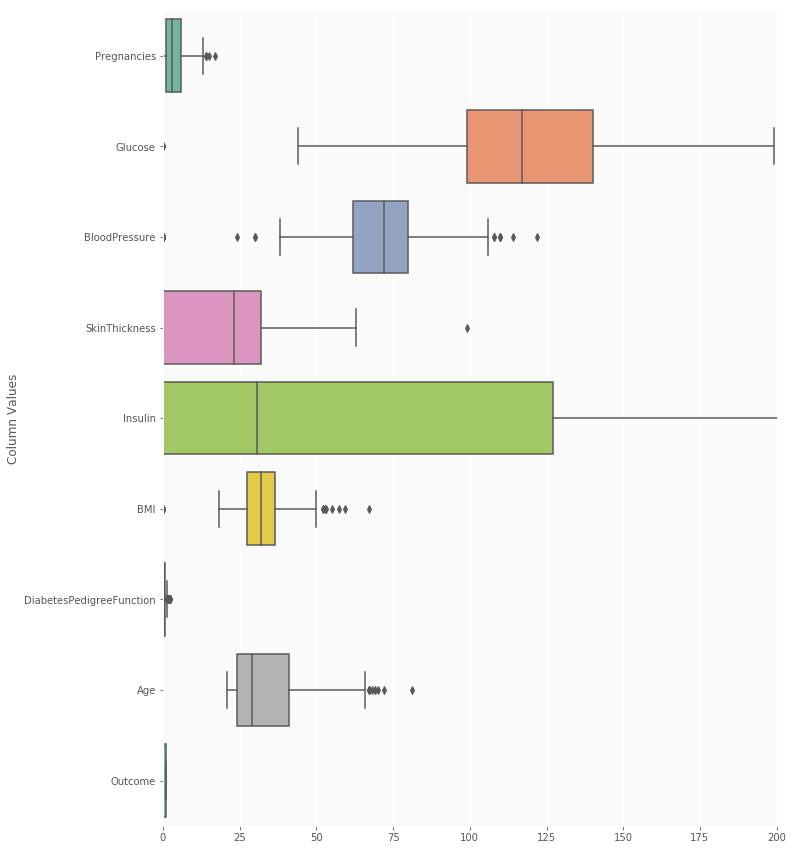

In [5]:
plt.style.use('ggplot') # Using ggplot2 style visuals  for box plot

f, ax = plt.subplots(figsize=(11, 15))

ax.set_facecolor('#fafafa')
ax.set(xlim=(-.05, 200))
plt.ylabel('Column Values')
ax = sns.boxplot(data = dataFrame, 
  orient = 'h', 
  palette = 'Set2')

In [6]:
#function to use z score to identify the outliers for columns that require to be analyzed-just another way that clarifies 
#that our data set has got zeroes
outliers=[]
def detect_outlier(data):
    
    threshold=3
    mean = np.mean(data)
    std =np.std(data)
    
    
    for y in data:
        z_score= (y - mean)/std
        if np.abs(z_score) > threshold:
            outliers.append(y)
    return outliers

In [7]:
#example to show on recognizing outliers for columns
outlier_datapoints = detect_outlier(dataFrame['BMI'])
print(outlier_datapoints)

[0.0, 0.0, 0.0, 0.0, 0.0, 67.1, 0.0, 0.0, 59.4, 0.0, 0.0, 57.3, 0.0, 0.0]


In [8]:
#copying the original data set to a new dataframe for further operations
dataFrame_copy = dataFrame.copy(deep = True)
dataFrame_copy[['Glucose','BloodPressure','SkinThickness','Insulin','BMI']] = dataFrame_copy[['Glucose','BloodPressure','SkinThickness','Insulin','BMI']].replace(0,np.NaN)

## showing the count of Nans
print(dataFrame_copy.isnull().sum())

Pregnancies                   0
Glucose                       5
BloodPressure                35
SkinThickness               227
Insulin                     374
BMI                          11
DiabetesPedigreeFunction      0
Age                           0
Outcome                       0
dtype: int64


In [9]:
#checking on the median for each outcome
data_median = dataFrame[['Age','BMI','SkinThickness','Outcome']].groupby(['Outcome'])[['Age','BMI','SkinThickness']].median()
data_median

,Age,BMI,SkinThickness
Outcome,,,
0,27,30.05,21
1,36,34.25,27


We can see that are a lot of values that are having zero as their values. This is not good as we need the values to analyze the data further.

In [10]:
#best way is to have mean/median being filled as the values that have NaN from previous steps. 

dataFrame_copy['Glucose'].fillna(dataFrame_copy['Glucose'].mean(), inplace = True)
dataFrame_copy['BloodPressure'].fillna(dataFrame_copy['BloodPressure'].mean(), inplace = True)
dataFrame_copy['SkinThickness'].fillna(dataFrame_copy['SkinThickness'].median(), inplace = True)
dataFrame_copy['Insulin'].fillna(dataFrame_copy['Insulin'].median(), inplace = True)
dataFrame_copy['BMI'].fillna(dataFrame_copy['BMI'].median(), inplace = True)

In [11]:
#getting the count of healthy and diabetic people for visual analysis ease
healthy=dataFrame_copy[dataFrame_copy['Outcome']==0]
diabetic=dataFrame_copy[dataFrame_copy['Outcome']==1]

In [12]:
healthy.describe()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
count,500.000000,500.000000,500.000000,500.000000,500.000000,500.000000,500.000000,500.000000,500.0
mean,3.298000,110.710121,70.935397,27.726000,127.792000,30.885600,0.429734,31.190000,0.0
std,3.017185,24.717060,11.931033,8.552966,74.447469,6.504128,0.299085,11.667655,0.0
min,0.000000,44.000000,24.000000,7.000000,15.000000,18.200000,0.078000,21.000000,0.0
25%,1.000000,93.000000,63.500000,22.000000,95.000000,25.750000,0.229750,23.000000,0.0
50%,2.000000,107.500000,72.000000,29.000000,125.000000,30.400000,0.336000,27.000000,0.0
75%,5.000000,125.000000,78.000000,31.000000,125.000000,35.300000,0.561750,37.000000,0.0
max,13.000000,197.000000,122.000000,60.000000,744.000000,57.300000,2.329000,81.000000,0.0


In [13]:
diabetic.describe()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
count,268.000000,268.000000,268.000000,268.000000,268.000000,268.000000,268.000000,268.000000,268.0
mean,4.865672,142.165573,75.147324,31.686567,164.701493,35.383582,0.550500,37.067164,1.0
std,3.741239,29.541750,11.945712,8.662994,100.932249,6.595603,0.372354,10.968254,0.0
min,0.000000,78.000000,30.000000,7.000000,14.000000,22.900000,0.088000,21.000000,1.0
25%,1.750000,119.000000,68.000000,29.000000,125.000000,30.900000,0.262500,28.000000,1.0
50%,4.000000,140.000000,74.000000,29.000000,125.000000,34.250000,0.449000,36.000000,1.0
75%,8.000000,167.000000,82.000000,36.000000,167.250000,38.775000,0.728000,44.000000,1.0
max,17.000000,199.000000,114.000000,99.000000,846.000000,67.100000,2.420000,70.000000,1.0


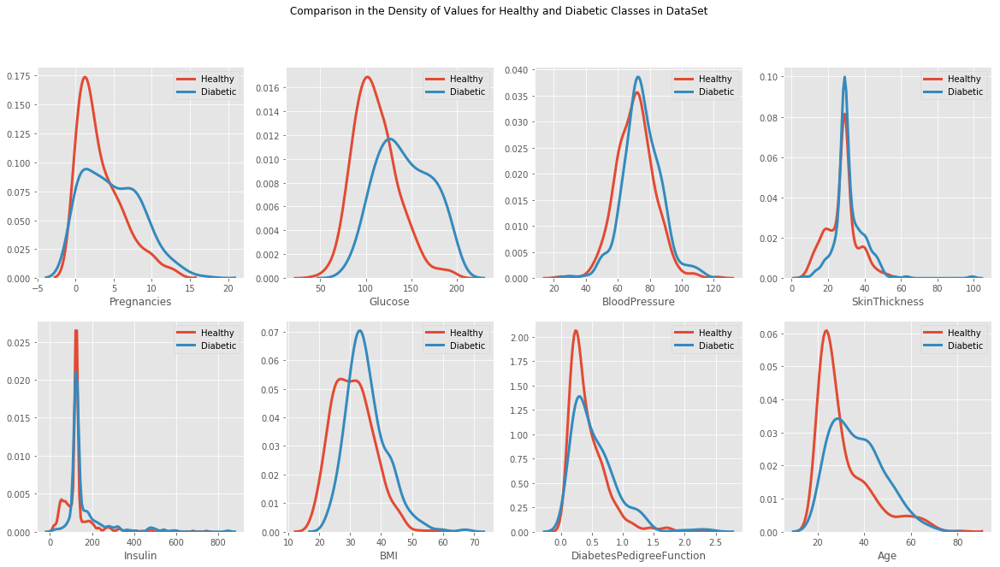

In [14]:
#comparing all the description values in terms of their distribituion in Probability Density Functions
f, axes = plt.subplots(2, 4,figsize=(20,10))
count=0

for i in range(2):
    for j in range(4):
        
        sns.distplot(healthy.iloc[:,count],kde=True,hist=False,kde_kws = {'linewidth': 3},label = 'Healthy',ax = axes[i][j])
        sns.distplot(diabetic.iloc[:,count],kde=True,hist=False,kde_kws = {'linewidth': 3},label = 'Diabetic',ax = axes[i][j])
        axes[i][j].legend()
        count=count+1
        
f.suptitle('Comparison in the Density of Values for Healthy and Diabetic Classes in DataSet')
plt.show()
      

In [15]:
#plotly plots to check on how the distribution curve looks like for insulin across both classes
#--do not run this cell with the credentials provided
plotly.tools.set_credentials_file(username='surajnairgangadharan', api_key='6fIEjU3P5TST6LEHsOmH')
x1 = healthy['Insulin']
x2 = diabetic['Insulin']
hist_data = [x1, x2]
group_labels = ['Healthy', 'Diabetic']
fig = ff.create_distplot(hist_data, group_labels,
                         curve_type='kde', show_hist=True, show_rug=True,bin_size=0)
fig['layout'].update(title='Insulin Level for Healthy v/s Diabetic')
py.iplot(fig)

In [36]:
#BMI comparision for healthy versus diabetic --do not run this cell with the credentials provided
plotly.tools.set_credentials_file(username='surajnairgangadharan', api_key='6fIEjU3P5TST6LEHsOmH')
x1 = healthy['BMI']
x2 = diabetic['BMI']
hist_data = [x1, x2]
group_labels = ['Healthy', 'Diabetic']
fig = ff.create_distplot(hist_data, group_labels,
                         curve_type='kde', show_hist=True, show_rug=True,bin_size=0)
fig['layout'].update(title='BMI distribution for Healthy v/s Diabetic')
py.iplot(fig)

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x0000005644932E48>,
      dtype=object)

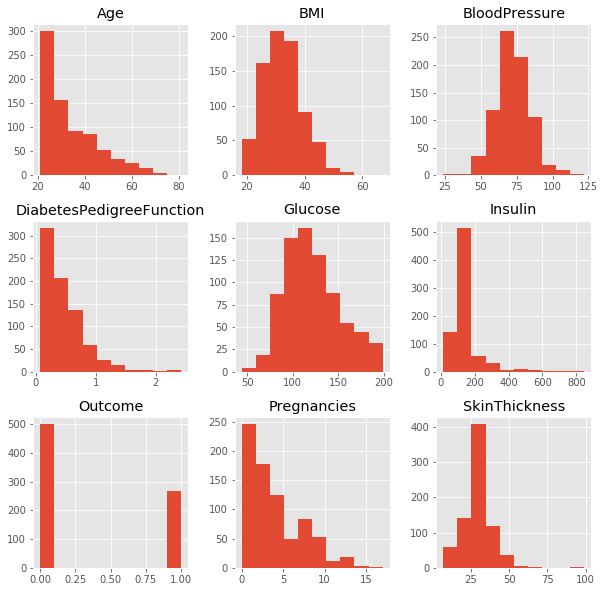

In [17]:
#checking the distribution for each column after replacement of 0 with respective mesaure of central tendency values
dataFrame_copy.hist(figsize = (10,10))

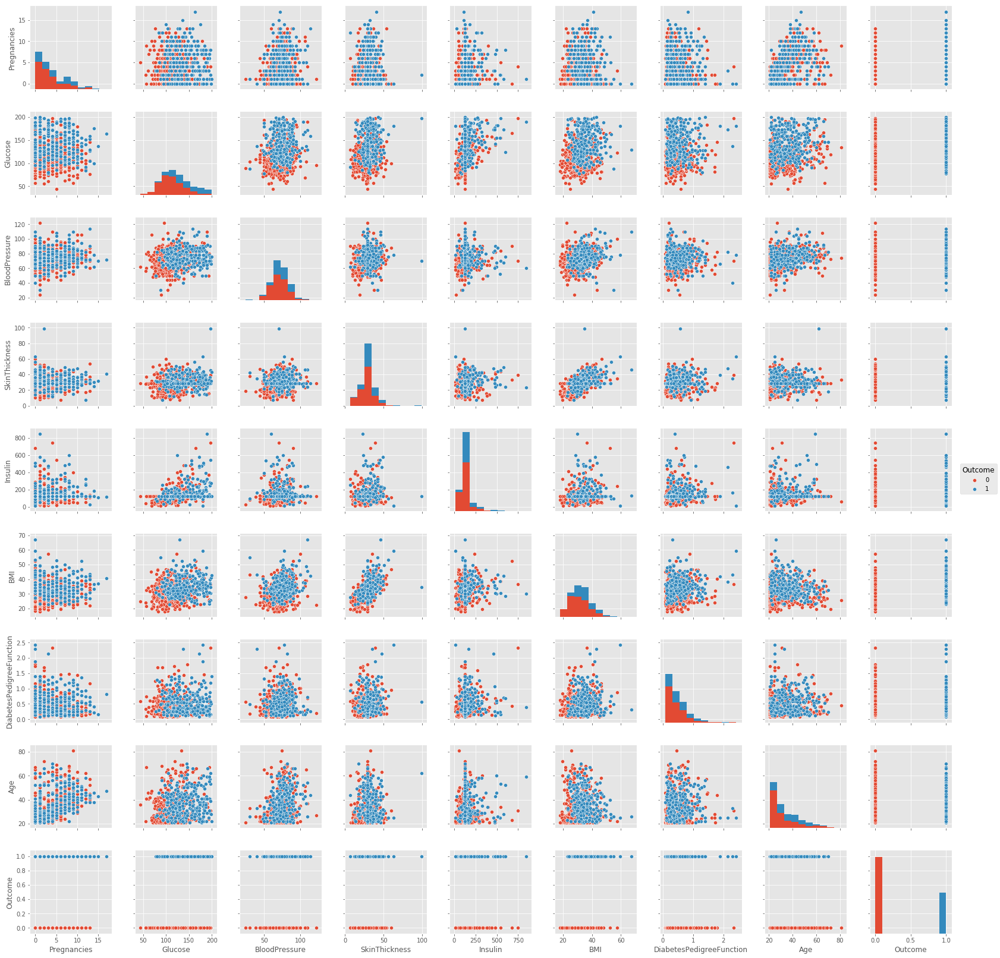

In [18]:
#understanding the relation that the columns have with each other
sns.pairplot(dataFrame_copy,hue="Outcome")

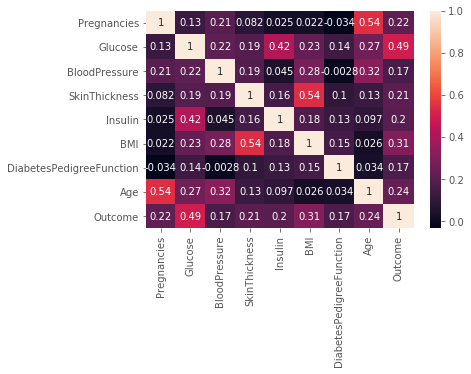

In [19]:
#correlation analysis
corr = dataFrame_copy.corr()
sns.heatmap(corr, annot=True)

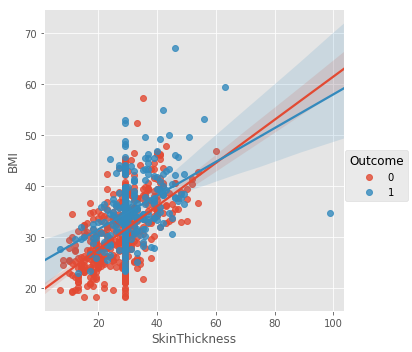

In [20]:
sns.lmplot(x="SkinThickness",y="BMI",hue="Outcome",data=dataFrame_copy)

In [14]:
#grouping the age values to check the number of diabetic patients in each group
age_group=[]
for i in dataFrame['Age']:
    if ((i>=21) & (i<=31)):
        age_group.append('Young(21-31)')
    elif((i>31) & (i<=51)):
        age_group.append('Middle Age(32-51)')
    else:
        age_group.append('Old(52 and Above)')
dataFrame_copy['AgeGroup']=age_group

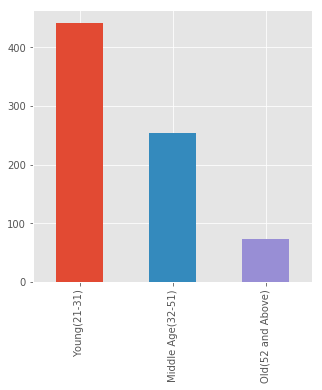

In [15]:
dataFrame_copy['AgeGroup'].value_counts(ascending=False).plot(kind= 'bar',figsize=(5,5))

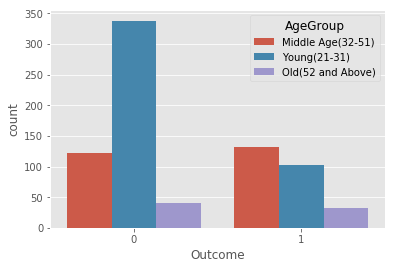

In [23]:
sns.countplot(x="Outcome", hue="AgeGroup", data=dataFrame_copy)

Shows that young people are at a lesser risk for diabetes 

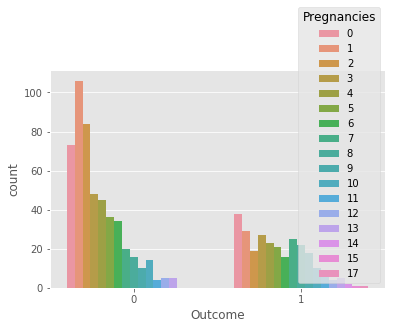

In [24]:
sns.countplot(x="Outcome", hue="Pregnancies", data=dataFrame_copy)

To an extend, pregnancies are also a factor. Higher the number, people are in diabetic. This might be because pregancies can have relationship with age as well

In [16]:
#since max and min and values are different for different columns, before building an ML model,scaling is important
#we are scaling using standard scaler library provided by sk learn
from sklearn.preprocessing import StandardScaler
sc_X = StandardScaler()
X =  pd.DataFrame(sc_X.fit_transform(dataFrame_copy.drop(["Outcome","AgeGroup"],axis = 1),),
        columns=['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin','BMI', 'Age','DiabetesPedigreeFunction'])

In [17]:
y = dataFrame_copy.Outcome

In [48]:
#splitting the data to training set and test set. in order to make sure that the set split happens properly i.e.
#both classes get equally represented in both training an test sets we are enabling stratifify function as the outcome column
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.2,random_state=2, stratify=y)

In [49]:
from imblearn.over_sampling import SMOTE

In [50]:
os=SMOTE(random_state=0)

In [59]:
columns=X_train.columns
os_data_X,os_data_y=os.fit_sample(X_train,y_train.ravel())
os_data_X=pd.DataFrame(data=os_data_X,columns=columns)
os_data_y=pd.DataFrame(data=os_data_y,columns=['y'])
train_y = np.array(os_data_y).astype(int)

In [60]:
#LogisticRegression

from sklearn.linear_model import LogisticRegression

model = LogisticRegression()
#fiting the model
model.fit(os_data_X,train_y)
#prediction
prediction = model.predict(X_test)

D:\AnacondaPython\lib\site-packages\sklearn\utils\validation.py:578: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



In [61]:
from sklearn import metrics


#Accuracy
print("Accuracy ",metrics.accuracy_score(y_test, prediction)*100)

Accuracy  75.32467532467533


In [62]:
#Descition Tree
DT = DecisionTreeClassifier()

#fiting the model
DT.fit(os_data_X, os_data_y)

#prediction
y_pred = DT.predict(X_test)

#Accuracy
print("Accuracy ", DT.score(X_test, y_test)*100)

Accuracy  61.038961038961034


In [63]:
#Gradient Boosting
model = GradientBoostingClassifier()

#fiting the model
model.fit(os_data_X, os_data_y)

#prediction
y_pred = model.predict(X_test)

#Accuracy
print("Accuracy ", model.score(X_test, y_test)*100)

D:\AnacondaPython\lib\site-packages\sklearn\utils\validation.py:578: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



Accuracy  74.02597402597402


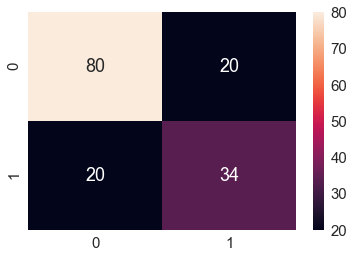

In [64]:
#building confusion matrix
sns.set(font_scale=1.5)
cm = confusion_matrix(y_pred, y_test)
sns.heatmap(cm, annot=True, fmt='g')
plt.show()

In [65]:
#KNN Classifier
from sklearn.neighbors import KNeighborsClassifier


test_scores = []
train_scores = []

for i in range(1,15):

    knn = KNeighborsClassifier(i)
    knn.fit(X_train,y_train)
    
    train_scores.append(knn.score(os_data_X,os_data_y))
    test_scores.append(knn.score(X_test,y_test))

In [66]:
maximumscore = max(test_scores)
test_scores_index = [i for i, v in enumerate(test_scores) if v == maximumscore]
print('k = {}'.format(list(map(lambda x: x+1, test_scores_index))))

k = [8, 9, 11, 13, 14]


In [67]:
#taking knn recommended value for classification
knn = KNeighborsClassifier(13)

#fitting
knn.fit(os_data_X,os_data_y)

print("Accuracy ", knn.score(X_test, y_test)*100)

Accuracy  65.5844155844156


D:\AnacondaPython\lib\site-packages\ipykernel_launcher.py:5: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



In [68]:
os_data_y.shape

(800, 1)

In [69]:
y_train.shape

(614,)

In [70]:
from sklearn.naive_bayes import GaussianNB
classifier = GaussianNB()
classifier.fit(os_data_X, os_data_y)

D:\AnacondaPython\lib\site-packages\sklearn\utils\validation.py:578: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



GaussianNB(priors=None, var_smoothing=1e-09)

In [71]:
classifier = GaussianNB()
classifier.fit(X_train, y_train)

GaussianNB(priors=None, var_smoothing=1e-09)

In [72]:
cm = confusion_matrix(y_test, y_pred)
print (cm)
print(accuracy_score(y_test, y_pred))

[[80 20]
 [20 34]]
0.7402597402597403
